## Import Libraries

In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf
from scipy import stats

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)  

# Some styling
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

import plotly.io as pio
pio.renderers.default = 'colab'
pio.templates.default = 'ggplot2'
%matplotlib inline

# Disable warnings 
import warnings
warnings.filterwarnings('ignore')

## Import & Splitting Data

Firstly, we split the dataset into two parts, dev set and test set. The dev set will be used for EDA, data preprocessing, and model training. While the test set is an unseen data we use for predicting. 

Since the PRICE is related to the SALEDATE, we will use 80% of the earliest SALEDATE as the dev set and remaining 20% for the test to copy the real world condition, where we have past data to train and predict the future.

In [60]:
raw_data_link = 'https://raw.githubusercontent.com/elvanselvano/purwadhika-final-project/main/dataset/raw_dataset.csv'
df = pd.read_csv(raw_data_link, index_col=0)

In [61]:
df['SALEDATE'] = pd.to_datetime(df['SALEDATE'])

In [62]:
df_date_sorted = df.sort_values(by='SALEDATE')
(df_date_sorted['SALEDATE'].dropna().shape[0])*0.8

105749.6

In [63]:
dev = df_date_sorted.iloc[:105750,:]
dev = dev.sort_index().reset_index(drop=True)
test = df_date_sorted.iloc[105751:,:]
test = test.sort_index().reset_index(drop=True)

In [79]:
from google.colab import files
dev.to_csv('dev2.csv',index=False)
files.download('dev2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
test.to_csv('test2.csv',index=False)
files.download('test2.csv')

In [64]:
df = dev.copy() #using only dev set for EDA

In [65]:
df.head()

,BATHRM,HF_BATHRM,HEAT,AC,NUM_UNITS,ROOMS,BEDRM,AYB,YR_RMDL,EYB,STORIES,SALEDATE,PRICE,QUALIFIED,SALE_NUM,GBA,BLDG_NUM,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,GIS_LAST_MOD_DTTM,SOURCE,CMPLX_NUM,LIVING_GBA,FULLADDRESS,CITY,STATE,ZIPCODE,NATIONALGRID,LATITUDE,LONGITUDE,ASSESSMENT_NBHD,ASSESSMENT_SUBNBHD,CENSUS_TRACT,CENSUS_BLOCK,WARD,SQUARE,X,Y,QUADRANT
0,4,0,Warm Cool,Y,2.0,8,4,1910.0,1988.0,1972,3.0,2003-11-25,1095000.0,Q,1,2522.0,1,3 Story,Row Inside,Very Good,Good,Common Brick,Metal- Sms,Hardwood,2.0,5,24,1680,2018-07-22 18:01:43,Residential,NaN,NaN,1748 SWANN STREET NW,WASHINGTON,DC,20009.0,18S UJ 23061 09289,38.914680,-77.040832,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,152,-77.040429,38.914881,NW
1,3,1,Warm Cool,Y,2.0,11,5,1898.0,2007.0,1972,3.0,2000-08-17,NaN,U,1,2567.0,1,3 Story,Row Inside,Very Good,Good,Common Brick,Built Up,Hardwood,2.0,4,24,1680,2018-07-22 18:01:43,Residential,NaN,NaN,1746 SWANN STREET NW,WASHINGTON,DC,20009.0,18S UJ 23067 09289,38.914683,-77.040764,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,152,-77.040429,38.914881,NW
2,3,1,Hot Water Rad,Y,2.0,8,5,1900.0,2003.0,1984,3.0,2006-07-12,1602000.0,Q,1,2484.0,1,3 Story,Row Inside,Very Good,Good,Common Brick,Built Up,Hardwood,2.0,3,24,1680,2018-07-22 18:01:43,Residential,NaN,NaN,1742 SWANN STREET NW,WASHINGTON,DC,20009.0,18S UJ 23078 09288,38.914683,-77.040629,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,152,-77.040429,38.914881,NW
3,3,2,Hot Water Rad,Y,1.0,10,5,1913.0,NaN,1972,4.0,2010-02-26,1950000.0,Q,1,5344.0,1,4 Story,Row Inside,Very Good,Good,Common Brick,Built Up,Hardwood,1.0,4,11,2196,2018-07-22 18:01:43,Residential,NaN,NaN,1709 S STREET NW,WASHINGTON,DC,20009.0,18S UJ 23157 09248,38.914331,-77.039715,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,152,-77.040429,38.914881,NW
4,1,0,Warm Cool,Y,2.0,5,2,1917.0,1988.0,1957,2.0,2011-05-02,NaN,U,1,1260.0,1,2 Story,Row Inside,Above Average,Average,Common Brick,Metal- Sms,Hardwood,2.0,0,24,1261,2018-07-22 18:01:43,Residential,NaN,NaN,1769 SWANN STREET NW,WASHINGTON,DC,20009.0,18S UJ 23042 09323,38.914983,-77.041055,Old City 2,040 D Old City 2,4201.0,004201 2005,Ward 2,152,-77.040429,38.914881,NW


In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105750 entries, 0 to 105749
Data columns (total 48 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   BATHRM              105750 non-null  int64         
 1   HF_BATHRM           105750 non-null  int64         
 2   HEAT                105750 non-null  object        
 3   AC                  105750 non-null  object        
 4   NUM_UNITS           68481 non-null   float64       
 5   ROOMS               105750 non-null  int64         
 6   BEDRM               105750 non-null  int64         
 7   AYB                 105597 non-null  float64       
 8   YR_RMDL             57183 non-null   float64       
 9   EYB                 105750 non-null  int64         
 10  STORIES             68465 non-null   float64       
 11  SALEDATE            105750 non-null  datetime64[ns]
 12  PRICE               77516 non-null   float64       
 13  QUALIFIED           105750 no

## Encode Data Types

In order to visualize and analyze the data, we need to cast the data type according to the definition of the feature explained in the previous notebook.

In [5]:
df['NUM_UNITS'] = df['NUM_UNITS'].astype(pd.Int64Dtype())
df['KITCHENS'] = df['KITCHENS'].astype(pd.Int64Dtype())
df['USECODE'] = df['USECODE'].astype(pd.Int64Dtype()).astype('category')
df['ZIPCODE'] = df['ZIPCODE'].astype(pd.Int64Dtype()).astype('category')
df['CMPLX_NUM'] = df['CMPLX_NUM'].astype(pd.Int64Dtype())
df['CENSUS_TRACT'] = df['CMPLX_NUM'].astype(pd.Int64Dtype())
df['SALEDATE'] = pd.to_datetime(df['SALEDATE'])

We will also extract the year from the column `SALEDATE`.

In [6]:
df['SALEYEAR'] = df['SALEDATE'].dt.year

## 1. Price

### Qualified Price

The QUALIFIED feature is internally-used indicator to reflect if a sale is representative of market value according to the office's internal criteria. The label `Q` means Qualified while `U` means Unqualified. The author of the dataset suggest to drop the `U` records because it will affect the performance of the model.

First, we want to compare these value with `ROOMS` to see the distribution.

In [7]:
q = df[df['QUALIFIED']=='Q'] # qualified property
u = df[df['QUALIFIED']=='U'] # unqualified property

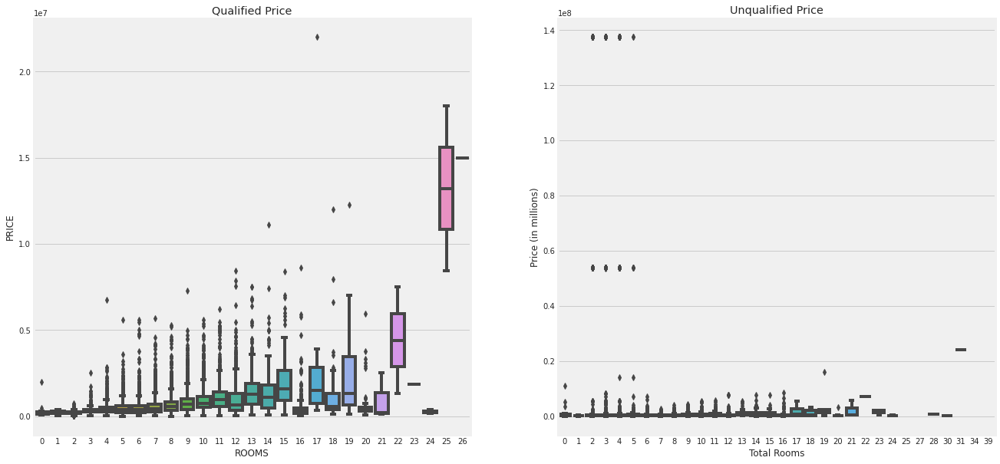

In [8]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
sns.boxplot(x='ROOMS', y='PRICE', data=q, ax=ax[0]).set_title('Qualified Price')
sns.boxplot(x='ROOMS', y='PRICE', data=u, ax=ax[1]).set_title('Unqualified Price')
plt.ylabel('Price (in millions)')
plt.xlabel('Total Rooms')
plt.show()

Based on the charts above, we can see that the unqualified property does not reflect the market value. Therefore, we will follow the author's suggestion to remove all of the unqualified property from our dataset. Then, we will remove the `QUALIFIED` feature because now it only contains a single value which is `Q`.

In [9]:
df_q = df[df['QUALIFIED']=='Q']
df_q = df_q.drop('QUALIFIED', axis=1)

In [10]:
print('Before removing unqualified property:', df.shape)
print('After removing unqualified property:', df_q.shape)

Before removing unqualified property: (105750, 49)
After removing unqualified property: (60012, 48)


### Price by Year

Now that we have qualified property, we will analyze the price by year. We can see that the price are increasing year by year although there are some years when the price of housing dropped.

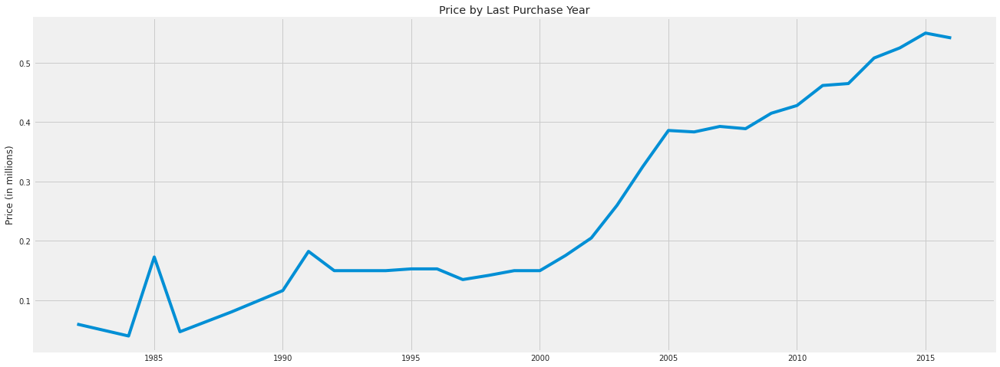

In [11]:
plt.figure(figsize=(20,8))
df_t = df_q.copy()
df_t['PRICE_MIL'] = df_q['PRICE']/1e6
yearly_med_price = df_t.groupby('SALEYEAR').median('PRICE_MIL')
sns.lineplot(x='SALEYEAR',y='PRICE_MIL',data=yearly_med_price,dashes=True)
plt.title('Price by Last Purchase Year')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

Thern, we will split the data based on the `WARD`. We can see that all of the prices are going up even though currently, the price of the property in `WARD 3` is currently downtrend.

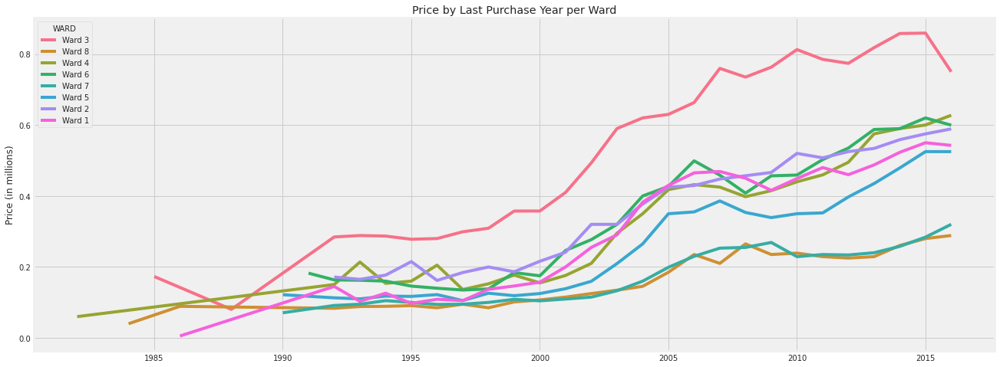

In [12]:
plt.figure(figsize=(20,8))
yearly_ward_price = df_t.groupby(['SALEYEAR','WARD']).median()
sns.lineplot(x='SALEYEAR',y='PRICE_MIL',data=yearly_ward_price , hue='WARD')
plt.title('Price by Last Purchase Year per Ward')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

Now, we will see the distribution of the column `PRICE`. We can see that this column is skewed because there are many houses with very expensive price and some houses with very cheap price.

In [13]:
fig = px.histogram(df_q, x='PRICE', nbins=200
                   , title='Distribution of Properties Price in DC',
                   color_discrete_sequence=px.colors.sequential.Viridis)

fig.update_layout(showlegend=False, margin=dict(l=20,r=20,t=40,b=20))
fig.show()

For the purpose of data visualization, we will only use **95% data** **(2.5% - 97.5%) in this EDA** in order to gain better insights of the data. It will also help us in finding the patterns in the charts we will be creating.

In [14]:
p2_5 = df_q['PRICE'].quantile(0.025)
p97_5 = df_q['PRICE'].quantile(0.975)

In [15]:
# get 95% data
df_viz_95 = df_q[(df_q['PRICE'] >= p2_5) & (df_q['PRICE'] <= p97_5)]

In [16]:
df_viz_95.PRICE.describe()

count    5.690500e+04
mean     4.596919e+05
std      2.867407e+05
min      8.360000e+04
25%      2.480000e+05
50%      3.900000e+05
75%      6.100000e+05
max      1.560000e+06
Name: PRICE, dtype: float64

After taking 95% of the data, we can see that the distribution is now much better and easier to be analyzed.

In [17]:
fig = px.histogram(df_viz_95, x='PRICE', nbins=40
                   ,marginal='box',title='Distribution of Properties Price in DC (95% data)',
                   color_discrete_sequence=px.colors.sequential.Viridis)

fig.update_layout(showlegend=False, margin=dict(l=20,r=20,t=40,b=20))
fig.show()

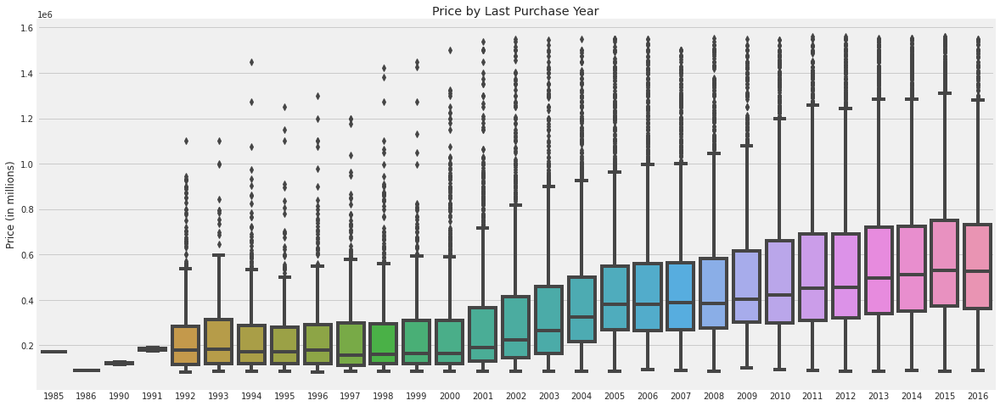

In [18]:
plt.figure(figsize=(18, 8))
sns.boxplot(x=df_viz_95['SALEYEAR'].dropna().astype(int), y=df_viz_95['PRICE'])
plt.title('Price by Last Purchase Year')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

The first chart shows the distribution of the price appears to be right-skewed. The range of the most expensive properties to the median, seems to be far higher than the gap to the lowest. This can reflect to the inequality of DC citizen. We also want to analyze the price distribution between property type and location

## Residential vs Condominium

Despite the difference is very subtle, the residential price is more expensive than the condominium in DC.

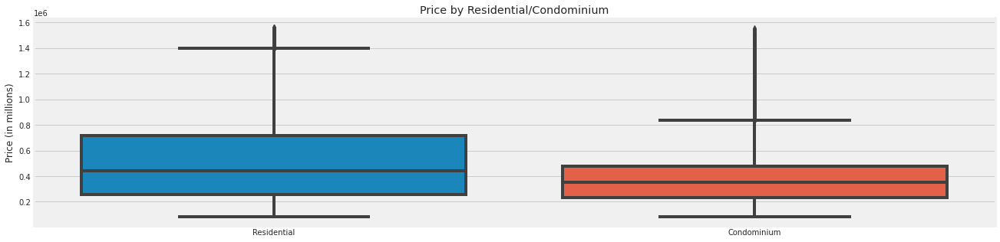

In [20]:
plt.figure(figsize=(20,5))
sns.boxplot(x='SOURCE', y='PRICE', data=df_viz_95).set_title('Price by Residential/Condominium')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

## Location

### Distribution by Region

In [21]:
quadrant = df_viz_95[~df_viz_95['QUADRANT'].isna()]
fig = px.scatter_mapbox(quadrant, lat='LATITUDE', lon='LONGITUDE', color='QUADRANT', hover_data=['QUADRANT', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Quadrant')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain',margin=dict(l=10,r=0,t=40,b=10))

fig.show()

In [22]:
fig = px.scatter_mapbox(df_viz_95, lat='LATITUDE', lon='LONGITUDE', color='WARD', hover_data=['WARD', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Wards')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain',margin=dict(l=10,r=0,t=40,b=10))

fig.show()

In [77]:
fig = px.scatter_mapbox(df_viz_95.sort_values(by='ZIPCODE'), lat='LATITUDE', lon='LONGITUDE', color='ZIPCODE', hover_data=['PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Alphabet, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Zipcode')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain',margin=dict(l=10,r=0,t=40,b=10))

fig.show()

In [54]:
fig = px.scatter_mapbox(df_viz_95, lat='LATITUDE', lon='LONGITUDE', color='ASSESSMENT_NBHD', hover_data=['WARD', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Alphabet, zoom=10, height=400, width=1000, opacity=1,
                        title='Distribution of Properties by Neighborhood')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain',margin=dict(l=10,r=0,t=40,b=10))
fig.show()

### House Style in Each Region

In [25]:
style = df_viz_95[~df_viz_95['STYLE'].isna()].copy() #remove missing data style
fig = px.scatter_mapbox(style, lat='LATITUDE', lon='LONGITUDE', color='STYLE', hover_data=['STYLE', 'WARD'],
                        color_discrete_sequence=px.colors.qualitative.Prism, zoom=10, height=400, width=800, opacity=1,
                        title='House Style Mapping')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain',margin=dict(l=10,r=0,t=40,b=10))
fig.show()

Most of the residential in DC is dominated by 2 Story House. Besides,in the NorthWest (Ward 1,2,3,4), the number of 2.5 Story is quite high, while in the Ward 7, 1 Story residential is also common.

### Regional Price Distribution

In [26]:
df_viz_95.PRICE.describe()

count    5.690500e+04
mean     4.596919e+05
std      2.867407e+05
min      8.360000e+04
25%      2.480000e+05
50%      3.900000e+05
75%      6.100000e+05
max      1.560000e+06
Name: PRICE, dtype: float64

In [73]:
#grouping price
price_cat_df = df_viz_95.copy()
price_cat_df = price_cat_df.sort_values(by='PRICE')
label = ['<300k','300-600k','600-900k','900k-1.2M','1.2-1.5M','>1.5M']
price_cat_df['PRICE_CAT'] = pd.cut(df_viz_95['PRICE'],bins=(np.arange(0,19,3)*100000).tolist(),labels=label)

In [78]:
fig = px.scatter_mapbox(price_cat_df, lat='LATITUDE', lon='LONGITUDE', color='PRICE_CAT', hover_data=['PRICE', 'WARD'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=0.5,
                        title='Price Mapping')
fig.update_traces(marker=dict(size=3.5))
fig.update_layout(mapbox_style='stamen-terrain',margin=dict(l=10,r=0,t=40,b=10))
fig.show()

The map above indicate the price distribution of residential seems different in each location. We can also see the image from DC government entitled Median Household Income below. It appears the price distribution of properties reflects to the household income. In Ward 3, where the properties price is the highest, has also the highest median household income than the others. In contrary, Ward 7 and 8, where the price is the lowest, have the lowest median household income.

We might look into the detail of price distribution in several location features.

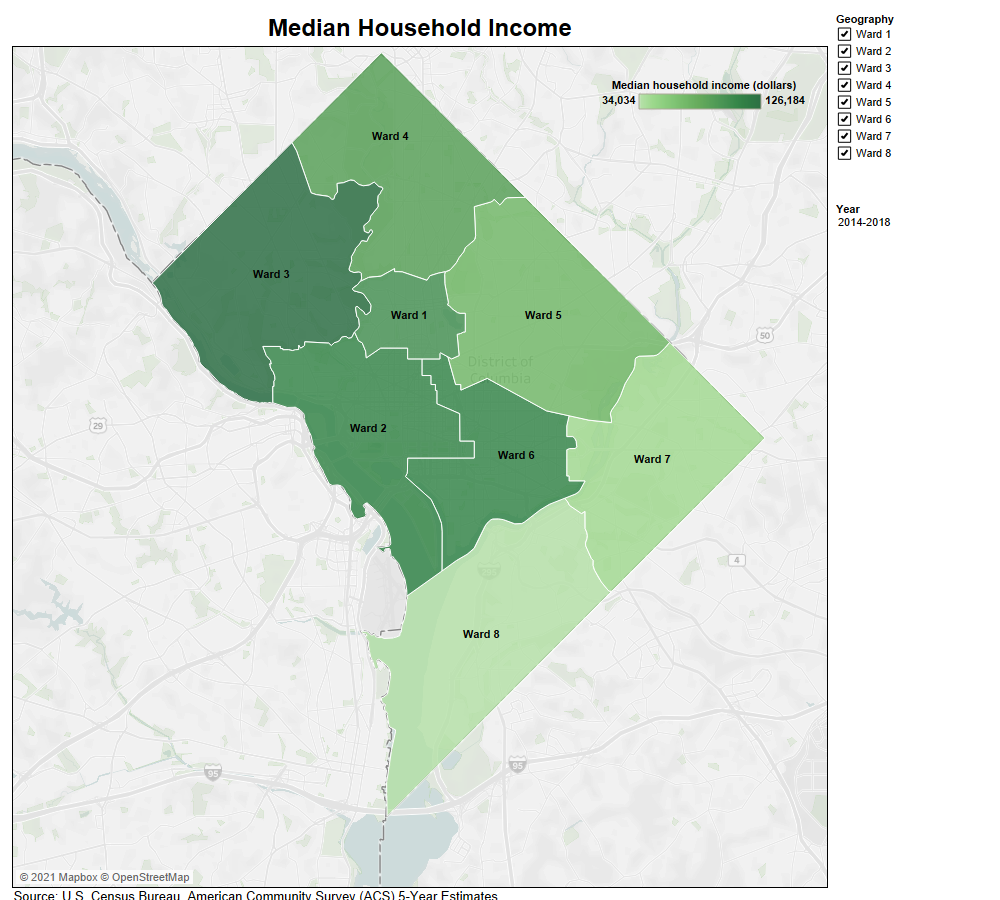

In [29]:
#define function of boxplot vs price_trans
def boxplot_cat_price(df,features,rows,cols,fig_size,title,pad=10,rotation=0,ord=True):
  df_no_na = df[features].copy().dropna()

  fig, ax = plt.subplots(rows,cols,figsize=fig_size)
  for i in range(len(features)-1):
    if ord==True:
      table = df_no_na.groupby([features[i]],as_index=False)['PRICE'].median().sort_values(by='PRICE',ascending=False)
      sns.boxplot(x=features[i],y='PRICE',data=df_no_na,ax=ax[i],order=table[features[i]].to_list()).set_title('Price by '+ features[i],fontsize=17)
    elif ord==False :
      sns.boxplot(x=features[i],y='PRICE',data=df_no_na,ax=ax[i]).set_title('Price by '+ features[i],fontsize=17)
  for i in fig.axes:
    plt.sca(i)
    plt.xticks(rotation=rotation)
  fig.suptitle(title, fontsize=25, fontweight='bold')
  fig.tight_layout(pad=pad)
  plt.show()

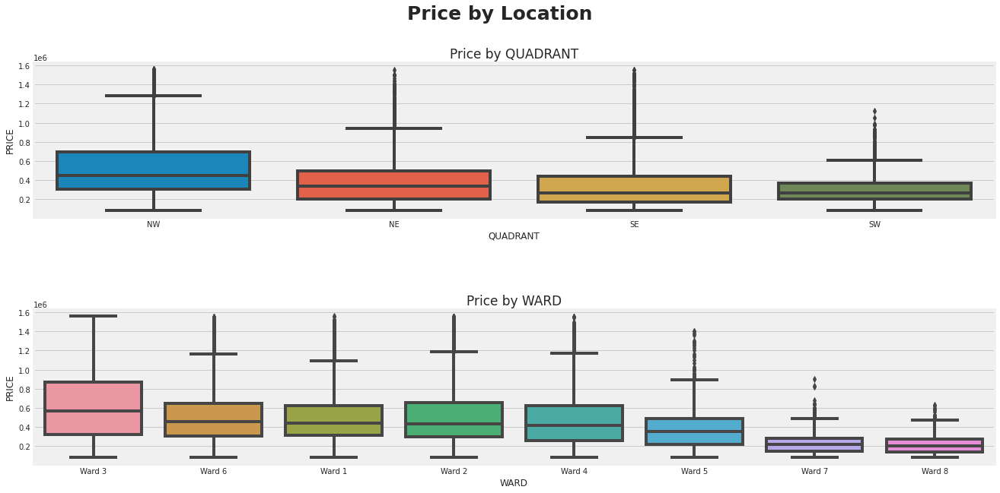

In [30]:
boxplot_cat_price(df_viz_95,['QUADRANT','WARD','PRICE'],2,1,(20,10),'Price by Location',7)

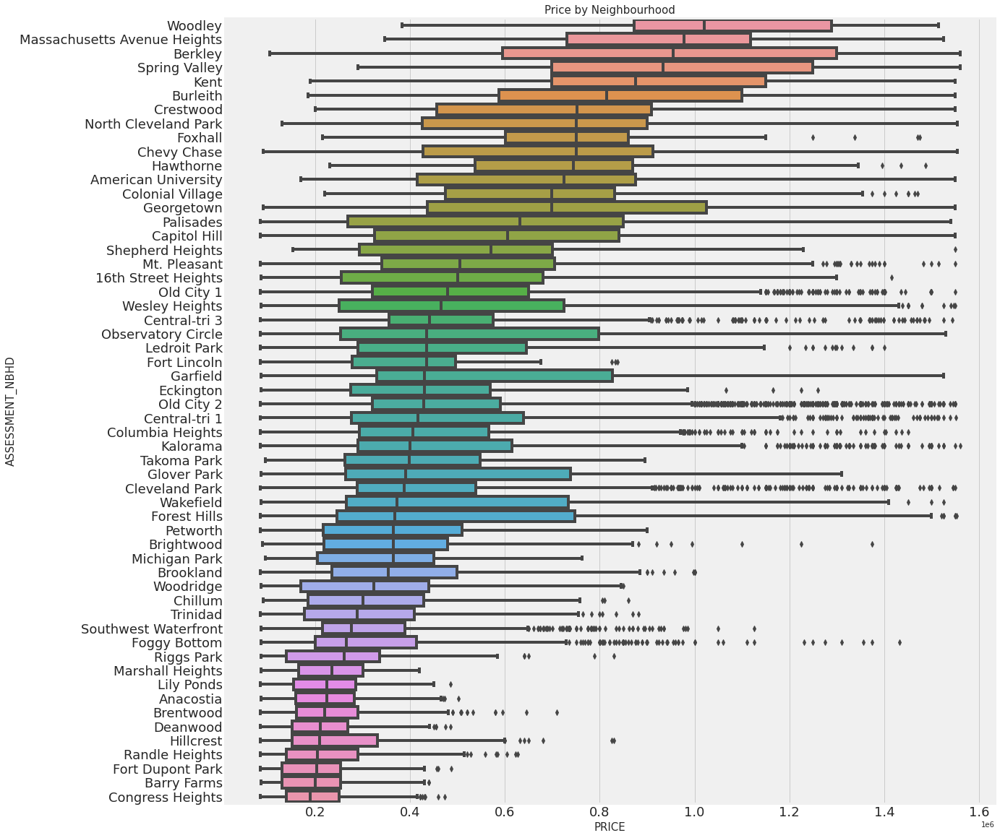

In [31]:
fig=plt.figure(figsize=(17,20))

table = df_viz_95.groupby(['ASSESSMENT_NBHD'],as_index=False)['PRICE'].median().sort_values(by='PRICE',ascending=False)

sns.boxplot(data=df_viz_95,x='PRICE',y='ASSESSMENT_NBHD',order=table['ASSESSMENT_NBHD'].to_list());
plt.yticks(fontsize=18);
plt.xticks(fontsize=18);
plt.title('Price by Neighbourhood',fontsize=15)
plt.ylabel("ASSESSMENT_NBHD",fontsize=15);
plt.xlabel("PRICE",fontsize=15);

In [32]:
#since the distribution is not normal, we will use the non-parametric test instead
#define function kruskal-wallis test vs price for all categorical value in each feature
def kruskal_price(feature,df):
  group_df = df[[feature, 'PRICE']].dropna().groupby([feature])
  group_list =[]
  val = df[feature].dropna().unique()
  for i in val:
    group_list.append(group_df.get_group(i)['PRICE'])
  
  h_stat, p_val = stats.kruskal(*group_list)
  print('Kruskal-Wallis Test results of {}\nH Stat = {}\nP = {}'.format(feature,h_stat, p_val))

In [33]:
for i in ['QUADRANT','WARD','ASSESSMENT_NBHD']:
  kruskal_price(i,df_q)
  print()

Kruskal-Wallis Test results of QUADRANT
H Stat = 6332.63378506232
P = 0.0

Kruskal-Wallis Test results of WARD
H Stat = 12474.50973279677
P = 0.0

Kruskal-Wallis Test results of ASSESSMENT_NBHD
H Stat = 18452.09745750989
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the the population distribution for each features vs price are different. This shows all three features (Quadrant,Ward, and Assessment NBHD) can distinguish price value.

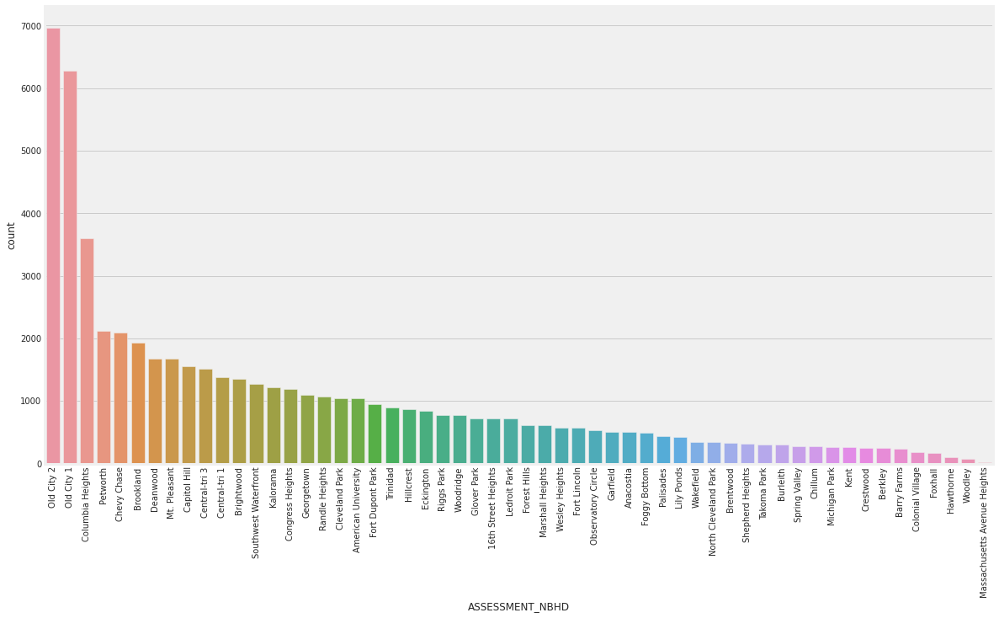

In [34]:
plt.figure(figsize=(18,10))
ca_count=sns.countplot(x=df_viz_95['ASSESSMENT_NBHD'], order = df_viz_95['ASSESSMENT_NBHD'].value_counts().index)
ca_count.set_xticklabels(ca_count.get_xticklabels(),rotation=90)
plt.show()

## Area

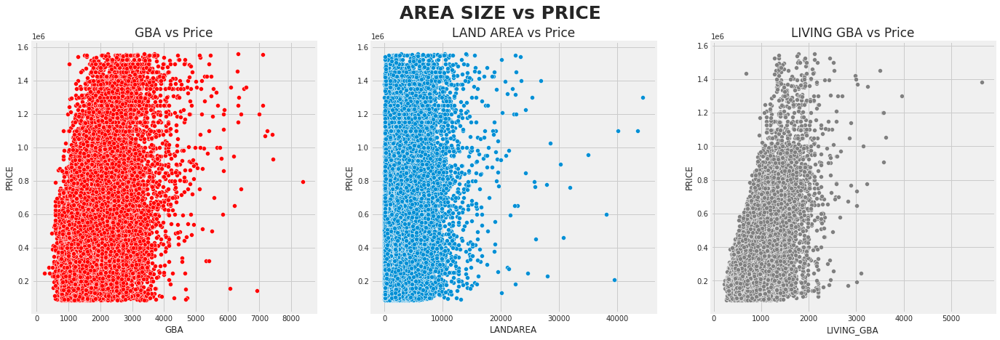

In [35]:
fig, ax =plt.subplots(1,3,figsize=(20,7))
sns.scatterplot(x='GBA',y='PRICE',data=df_viz_95,ax=ax[0],color='r').set_title('GBA vs Price', fontsize=17)
sns.scatterplot(x='LANDAREA',y='PRICE',data=df_viz_95,ax=ax[1]).set_title('LAND AREA vs Price', fontsize=17)
sns.scatterplot(x='LIVING_GBA',y='PRICE',data=df_viz_95,ax=ax[2],color='grey').set_title('LIVING GBA vs Price', fontsize=17)
fig.suptitle('AREA SIZE vs PRICE', fontsize=25, fontweight='bold')
fig.tight_layout(pad=4)
plt.show()

## Properties Feature

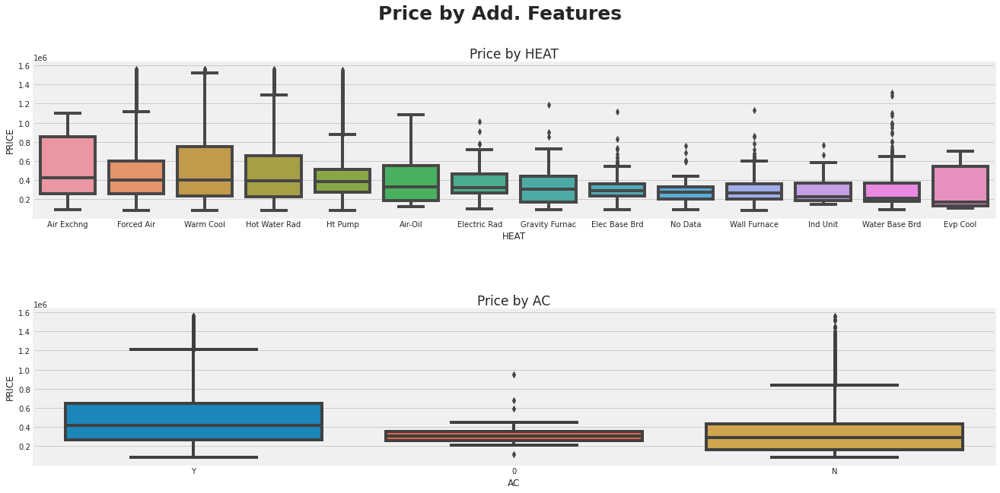

In [36]:
boxplot_cat_price(df_viz_95,['HEAT','AC','PRICE'],2,1,(20,10),'Price by Add. Features',7)

in AC, the 0 value seems to be an N. We might encode it first to get better visualization

In [37]:
add_feat = df_viz_95.copy()
add_feat['AC'] = np.where(df_viz_95['AC']=='Y',1,0) #change to 1,0

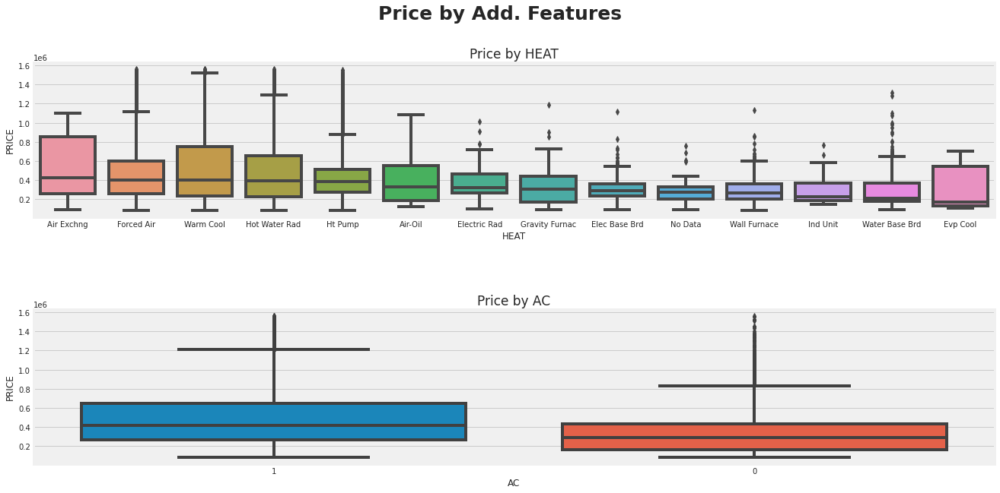

In [38]:
boxplot_cat_price(add_feat,['HEAT','AC','PRICE'],2,1,(20,10),'Price by Add. Features',7)

In [39]:
for i in ['HEAT','AC']:
  kruskal_price(i,df_q)
  print()

Kruskal-Wallis Test results of HEAT
H Stat = 781.2615915832988
P = 1.421802629567579e-158

Kruskal-Wallis Test results of AC
H Stat = 3264.2958042591786
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the population distribution for each features vs price are different. This shows all three features (Heat and AC) can distinguish price value.

## Grade and Condition

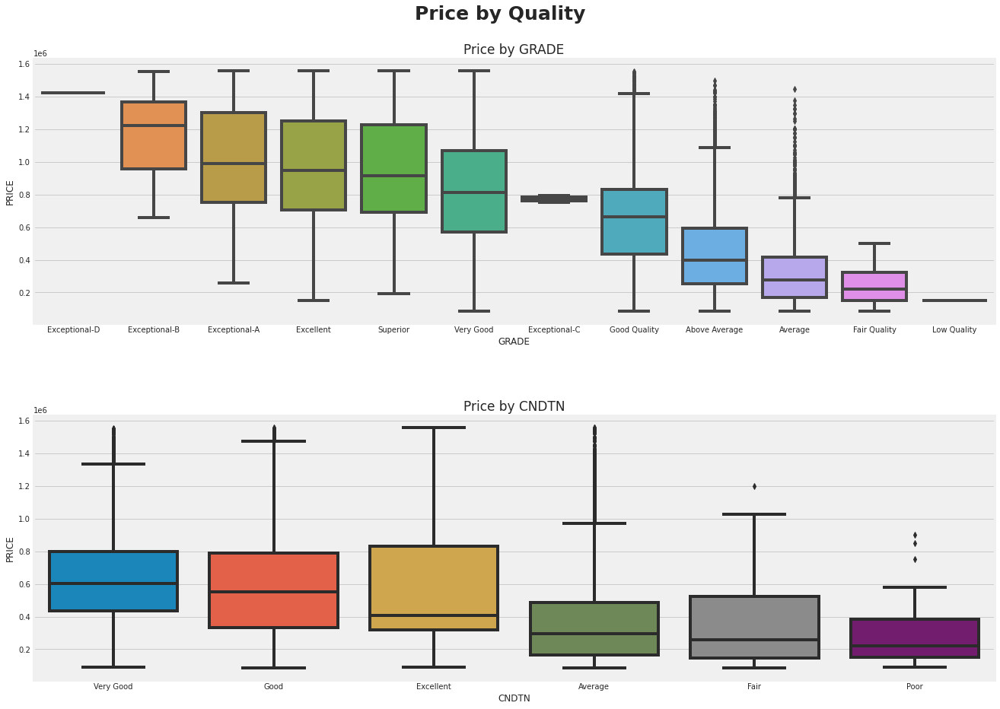

In [40]:
boxplot_cat_price(df_viz_95,['GRADE','CNDTN','PRICE'],2,1,(20,14),'Price by Quality',7)

In [41]:
for i in ['GRADE','CNDTN']:
  kruskal_price(i,df_q)
  print()

Kruskal-Wallis Test results of GRADE
H Stat = 14582.290561184112
P = 0.0

Kruskal-Wallis Test results of CNDTN
H Stat = 6933.270512414259
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the population distribution for each features vs price are different. This shows both features (GRADE and CNDTN) can distinguish price value.

## Material and Structure

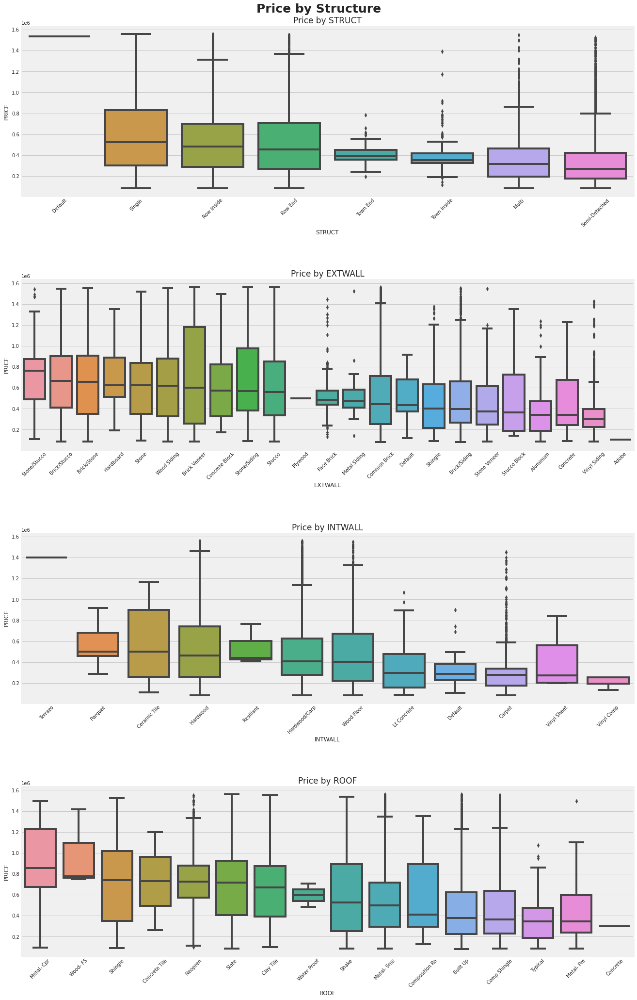

In [42]:
boxplot_cat_price(df_viz_95,['STRUCT','EXTWALL','INTWALL','ROOF','PRICE'],4,1,(20,30),'Price by Structure',7,45)

In [43]:
for i in ['STRUCT','EXTWALL','INTWALL','ROOF']:
  kruskal_price(i,df_q)
  print()

Kruskal-Wallis Test results of STRUCT
H Stat = 2877.91228124523
P = 0.0

Kruskal-Wallis Test results of EXTWALL
H Stat = 1599.8643187990413
P = 0.0

Kruskal-Wallis Test results of INTWALL
H Stat = 890.0861457429733
P = 8.38697457280575e-184

Kruskal-Wallis Test results of ROOF
H Stat = 2965.5451906057715
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the population distribution for each features vs price are different. This shows all four features (Struct, Extwall, Intwall and Roof) can distinguish price value.

## Other Numerical Features

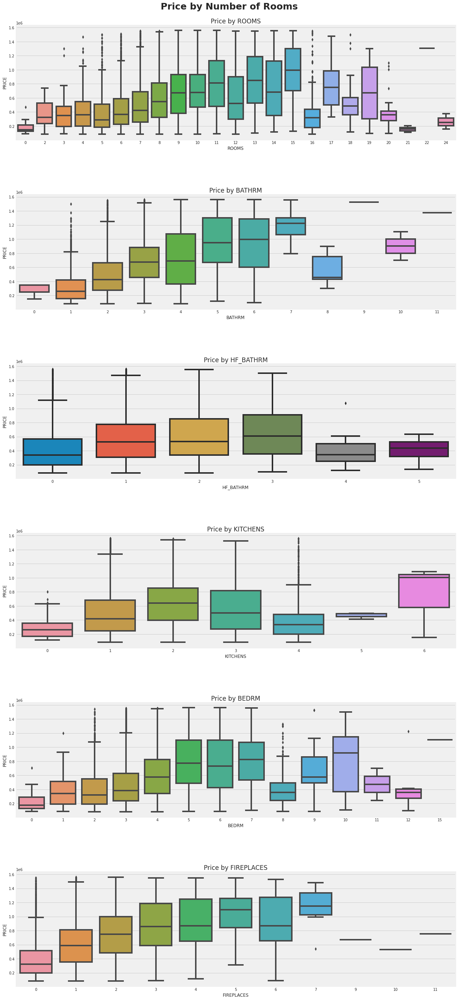

In [44]:
boxplot_cat_price(df_viz_95,['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES','PRICE'],6,1,(20,40),'Price by Number of Rooms',10,ord=False)

In [45]:
for i in ['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES']:
  kruskal_price(i,df_q)
  print()

Kruskal-Wallis Test results of ROOMS
H Stat = 10872.091149436454
P = 0.0

Kruskal-Wallis Test results of BATHRM
H Stat = 18429.68760370044
P = 0.0

Kruskal-Wallis Test results of HF_BATHRM
H Stat = 6902.235311969062
P = 0.0

Kruskal-Wallis Test results of KITCHENS
H Stat = 1252.2677870864106
P = 2.3291462323924334e-267

Kruskal-Wallis Test results of BEDRM
H Stat = 10866.385676182896
P = 0.0

Kruskal-Wallis Test results of FIREPLACES
H Stat = 12071.021330576166
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the population distribution for each features vs price are different. This shows all features (Rooms, Bathrm, HF_Bathrm, Kitchens, Bedrm, and Fireplaces) can distinguish price value.

Next, we would like to see whether any correlation between these features with price

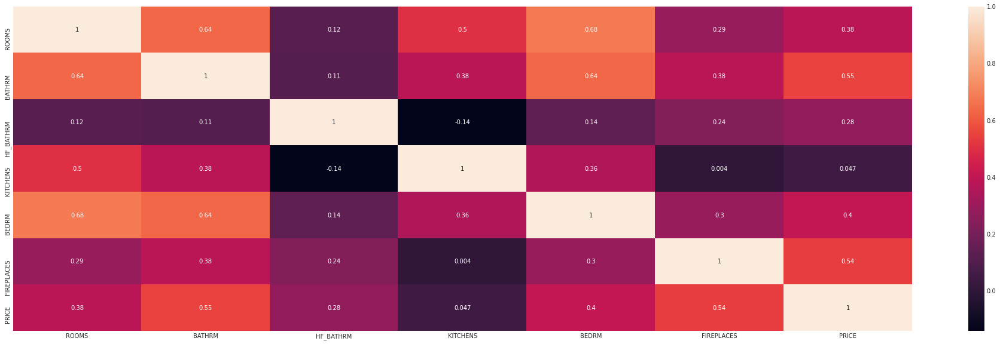

In [46]:
num_feat = df_q[['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES','PRICE']].copy().dropna()

plt.figure(figsize=(30,10))
sns.heatmap(num_feat.corr(), annot=True, cmap='rocket')
plt.show()

## Correlation Network

In order to analyze the correlation between each feature, we will use a correlation network.

In [47]:
!pip install network

  Created wheel for network: filename=network-0.1-cp37-none-any.whl size=3157 sha256=f0a1375b0f0c1301ab962ba5e44462a0ce7c0c2fa1e7fa68d2c008a77e0b0464
  Stored in directory: /root/.cache/pip/wheels/f6/e7/6a/70989d7246573ac455e33b059ed204518c33e9c276965f005f
Successfully built network


In [48]:
import networkx as nx

In [49]:
corr = df_q.corr()

In [50]:
indices = corr.index.values
cor_matrix = np.asmatrix(corr)
G = nx.from_numpy_matrix(cor_matrix)
G = nx.relabel_nodes(G,lambda x: indices[x])
G.edges(data=True)

EdgeDataView([('BATHRM', 'BATHRM', {'weight': 1.0}), ('BATHRM', 'HF_BATHRM', {'weight': 0.31067291518678786}), ('BATHRM', 'NUM_UNITS', {'weight': 0.35110808761301415}), ('BATHRM', 'ROOMS', {'weight': 0.714921668482796}), ('BATHRM', 'BEDRM', {'weight': 0.7152060902250642}), ('BATHRM', 'AYB', {'weight': -0.05884772929991565}), ('BATHRM', 'YR_RMDL', {'weight': 0.230956030263408}), ('BATHRM', 'EYB', {'weight': 0.27610173399698196}), ('BATHRM', 'STORIES', {'weight': 0.02075088953545388}), ('BATHRM', 'PRICE', {'weight': 0.5715014700202355}), ('BATHRM', 'SALE_NUM', {'weight': 0.04742907520845409}), ('BATHRM', 'GBA', {'weight': 0.6993140274698398}), ('BATHRM', 'BLDG_NUM', {'weight': -0.005858460353906429}), ('BATHRM', 'KITCHENS', {'weight': 0.38327685065616846}), ('BATHRM', 'FIREPLACES', {'weight': 0.44453970199928144}), ('BATHRM', 'LANDAREA', {'weight': 0.46912715140368166}), ('BATHRM', 'CMPLX_NUM', {'weight': 0.14221986505109807}), ('BATHRM', 'LIVING_GBA', {'weight': 0.7339618186392683}), ('

In [51]:
def corr_network(G, corr_direction, min_correlation):
    H = G.copy()

    for s1, s2, weight in G.edges(data=True):       
        if corr_direction == "positive":
            if weight["weight"] < 0 or weight["weight"] < min_correlation:
                H.remove_edge(s1, s2)
        else:
            if weight["weight"] >= 0 or weight["weight"] > min_correlation:
                H.remove_edge(s1, s2)
                
    edges,weights = zip(*nx.get_edge_attributes(H,'weight').items())
    
    weights = tuple([(1+abs(x))**2 for x in weights])
   
    d = dict(nx.degree(H))
    nodelist=d.keys()
    node_sizes=d.values()
    
    positions=nx.circular_layout(H)
    
    plt.figure(figsize=(10,10))

    nx.draw_networkx_nodes(H,positions,node_color='#34ebe1',nodelist=nodelist,
                       node_size=tuple([x**3 for x in node_sizes]),alpha=0.8)

    nx.draw_networkx_labels(H, positions, font_size=8)

    if corr_direction == "positive":
        edge_colour = plt.cm.winter 
    else:
        edge_colour = plt.cm.autumn
        
    nx.draw_networkx_edges(H, positions, edgelist=edges,style='solid',
                          width=weights, edge_color = weights, edge_cmap = edge_colour,
                          edge_vmin = min(weights), edge_vmax=max(weights))
    plt.axis('off')
    plt.show() 

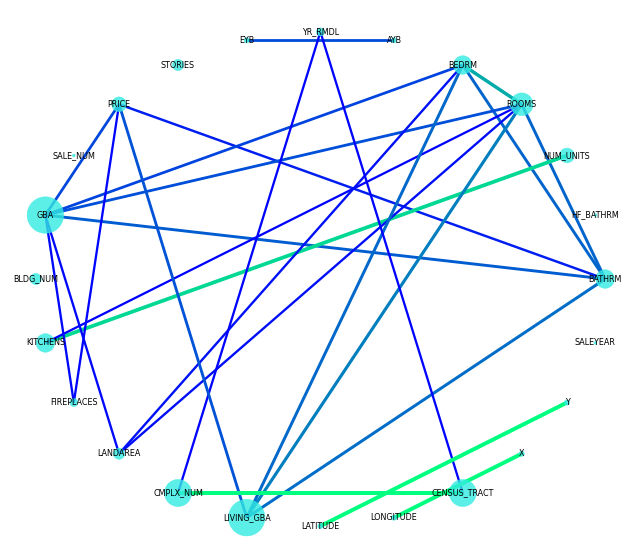

In [52]:
corr_network(G, corr_direction="positive",min_correlation = 0.5)

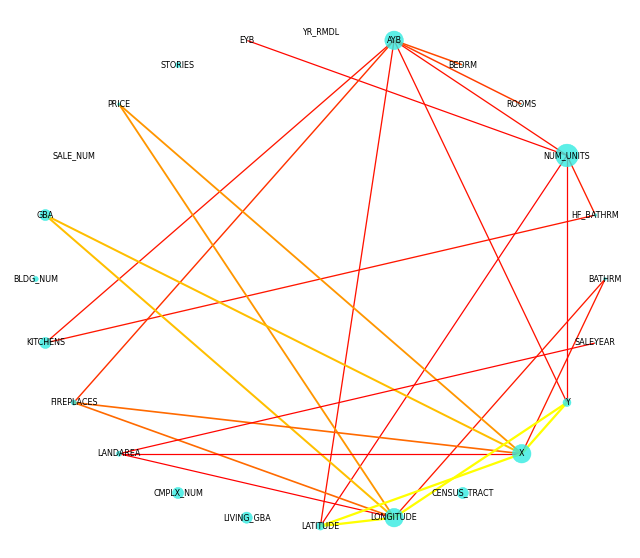

In [53]:
corr_network(G, corr_direction="negative",min_correlation = -0.1)